<a href="https://colab.research.google.com/github/Jaja-Chang/CAB420-Machine-Learning-Final-Project/blob/main/Dogs_and_Cats_Breeds_GMM_Solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive 
drive.mount('/content/drive')
jaja_root_dir = '/content/drive/My Drive/CAB420/Assignment/CAB420 Assignment 2'

Mounted at /content/drive


In [2]:
# check available RAM
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

Your runtime has 27.3 gigabytes of available RAM



In [3]:
import sys
sys.path.insert(0, jaja_root_dir)

In [4]:
import os
import pandas as pd
import cv2                          # for image loading and colour conversion
import os
import math
import random
import numpy as np                  # for reshaping, array manipulation
import tensorflow as tf             # for bulk image resize
import matplotlib.pyplot as plt     # for plotting

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from scipy.spatial import distance
from scipy.io import savemat, loadmat
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram
from matplotlib import cm
from tensorflow.keras.applications import InceptionResNetV2
from preprocessing import *


# for consistency
random.seed(4)

### Helper functions

In [5]:
# vectorise an array of images, such that the shape is changed from {samples, width, height, channels} to
# (samples, width * height * channels)
#   images: array of images to vectorise
#
#   returns: vectorised array of images
#
def vectorise(images):
    # use numpy's reshape to vectorise the data
    return np.reshape(images, [len(images), -1])

In [6]:
def GetTripletData(imgs, labels, batch_size):

    image_a = np.zeros((batch_size, np.shape(imgs)[1], np.shape(imgs)[2], np.shape(imgs)[3]));
    image_b = np.zeros((batch_size, np.shape(imgs)[1], np.shape(imgs)[2], np.shape(imgs)[3]));
    image_c = np.zeros((batch_size, np.shape(imgs)[1], np.shape(imgs)[2], np.shape(imgs)[3]));
    
    for i in range(batch_size):
        
        idx1 = random.randint(0, len(imgs) - 1)
        idx2 = random.randint(0, len(imgs) - 1)
        idx3 = random.randint(0, len(imgs) - 1)

        while (labels[idx1] != labels[idx2]):
            idx2 = random.randint(0, len(imgs) - 1)            
                
        while (labels[idx1] == labels[idx3]):
            idx3 = random.randint(0, len(imgs) - 1)

        image_a[i, :, :, :] = imgs[idx1,:,:,:]
        image_b[i, :, :, :] = imgs[idx2,:,:,:]
        image_c[i, :, :, :] = imgs[idx3,:,:,:]

    return [image_a, image_b, image_c]

def TripleGenerator(imgs, labels, batch_size):
    while True:
        [image_a, image_b, image_c] = GetTripletData(imgs, labels, batch_size)
        yield [image_a, image_b, image_c], None


In [7]:
class TripletLossLayer(layers.Layer):
    def __init__(self, alpha, **kwargs):
        self.alpha = alpha
        super(TripletLossLayer, self).__init__(**kwargs)
    
    def triplet_loss(self, inputs):
        anchor, positive, negative = inputs
        
        anchor = K.l2_normalize(anchor, axis=1)
        positive = K.l2_normalize(positive, axis=1)
        negative = K.l2_normalize(negative, axis=1)

        p_dist = K.sum(K.square(anchor-positive), axis=-1)
        n_dist = K.sum(K.square(anchor-negative), axis=-1)
        return K.sum(K.maximum(p_dist - n_dist + self.alpha, 0), axis=0)
    
    def call(self, inputs):
        loss = self.triplet_loss(inputs)
        self.add_loss(loss)
        return loss

In [8]:
def plot_animal(images, labels):
    for face in (np.unique(labels)):
        fig = plt.figure(figsize=[16, 3])
        fig.suptitle('ID ' + str(face))
        indexes = [i for i,x in enumerate(labels) if x == face]
        for j in range(min(len(indexes), 20)):
            ax = fig.add_subplot(2, 10, j+1)
            ax.set_axis_off()
            ax.imshow(images[indexes[j]]);

## Load Data and Data Pre-processing

In [9]:
# loader = ImageLoader(os.path.join(jaja_root_dir, 'bounded/'))
# X_train, y_train, X_val, y_val, X_test, y_test = loader.load_data(resize=[128,128], grayscale=False)

# # save data as mat files 
# savemat(os.path.join(jaja_root_dir, "bounded/mats/train.mat"), {'X_train': X_train, 'y_train': y_train})
# savemat(os.path.join(jaja_root_dir, "bounded/mats/val.mat"), {'X_val': X_val, 'y_val': y_val})
# savemat(os.path.join(jaja_root_dir, "bounded/mats/test.mat"), {'X_test': X_test, 'y_test': y_test})

In [10]:
# load mat files 
train = loadmat(os.path.join(jaja_root_dir, 'bounded/mats/train.mat'))
X_train = np.array(train['X_train'])
y_train = train['y_train']

val = loadmat(os.path.join(jaja_root_dir, 'bounded/mats/val.mat'))
X_val = np.array(val['X_val'])
y_val = val['y_val']

test = loadmat(os.path.join(jaja_root_dir, 'bounded/mats/test.mat'))
X_test = np.array(test['X_test'])
y_test = test['y_test']

print('X_train shape: ', X_train.shape)
print('X_val shape: ', X_val.shape)
print('y_test shape: ', y_test.shape)

X_train shape:  (2214, 128, 128, 3)
X_val shape:  (738, 128, 128, 3)
y_test shape:  (733,)


In [11]:
print('X_train shape: ', X_train.shape)
print('X_val shape: ', X_val.shape)
print('y_test shape: ', y_test.shape)

X_train shape:  (2214, 128, 128, 3)
X_val shape:  (738, 128, 128, 3)
y_test shape:  (733,)


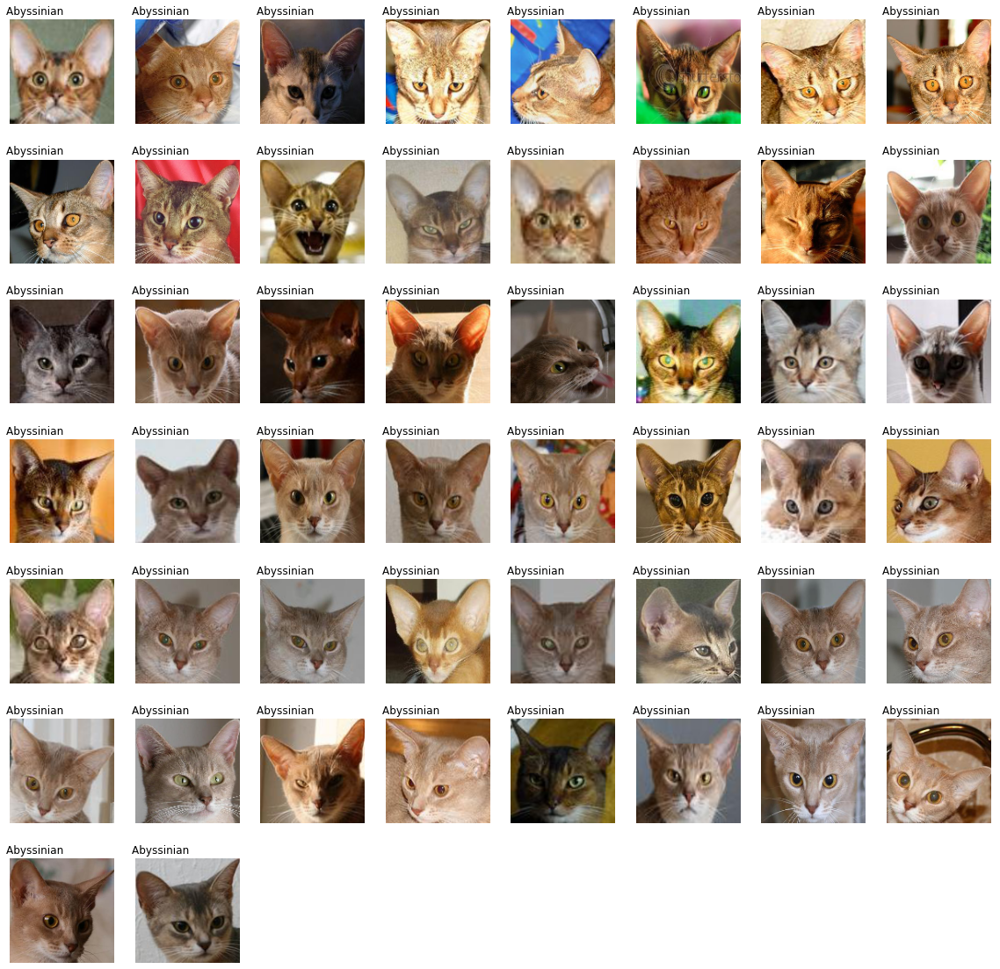

In [12]:
show_images(images=X_train[0:50], labels=y_train[0:50], figsize=[20,20])

## Triplet

In [13]:
embedding_size = 32

base_network = InceptionResNetV2(include_top=False, 
                                 weights="imagenet", 
                                 input_shape=(128, 128, 3), 
                                 pooling='avg')

# Freeze the base model
base_network.trainable = False

dummy_input = keras.Input((128, 128, 3))
base_network = base_network(dummy_input, training=False)

embedding_layer = layers.Dense(embedding_size, 
                               activation=None)(base_network)
base_network = keras.Model(dummy_input, 
                           embedding_layer, 
                           name='InceptionResNetV2')

219070464/219055592 [==============================] - 2s 0us/step


In [14]:
input_anchor = keras.Input((128, 128, 3), name='Anchor')
input_positive = keras.Input((128, 128, 3), name='Positive')
input_negative = keras.Input((128, 128, 3), name='Negative')

embedding_anchor = base_network(input_anchor)
embedding_positive = base_network(input_positive)
embedding_negative = base_network(input_negative)

margin = 2
loss_layer = TripletLossLayer(alpha=margin, 
                              name='triplet_loss_layer')(
                                  [embedding_anchor, 
                                   embedding_positive, 
                                   embedding_negative]
                                   )

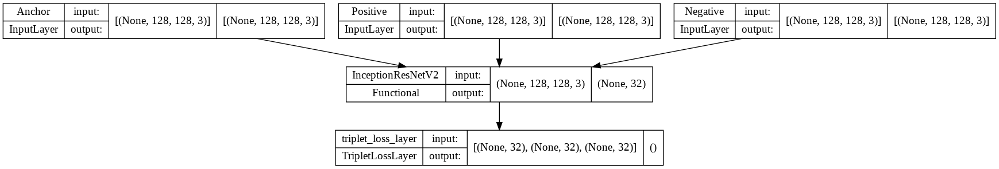

In [15]:
triplet_network = keras.Model(inputs=[input_anchor, input_positive, input_negative], outputs=loss_layer)
keras.utils.plot_model(triplet_network, show_shapes=True)

In [16]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
triplet_network.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001))

batch_size = 40
epochs = 1000
training_gen = TripleGenerator(X_train, y_train, batch_size)
triplet_val = GetTripletData(X_val, y_val, batch_size)

history = triplet_network.fit(training_gen, 
                              steps_per_epoch = 2214 // batch_size, 
                              epochs=epochs,
                              callbacks=[callback],
                              validation_data=(triplet_val, None))

Epoch 1/1000
55/55 [==============================] - 56s 357ms/step - loss: 26.9530 - val_loss: 12.2113
Epoch 2/1000
55/55 [==============================] - 11s 201ms/step - loss: 21.3992 - val_loss: 10.7879
Epoch 3/1000
55/55 [==============================] - 11s 203ms/step - loss: 18.5348 - val_loss: 10.3687
Epoch 4/1000
55/55 [==============================] - 11s 203ms/step - loss: 17.7261 - val_loss: 9.9495
Epoch 5/1000
55/55 [==============================] - 11s 207ms/step - loss: 16.9008 - val_loss: 9.3192
Epoch 6/1000
55/55 [==============================] - 11s 208ms/step - loss: 16.1480 - val_loss: 8.8831
Epoch 7/1000
55/55 [==============================] - 12s 210ms/step - loss: 15.9559 - val_loss: 8.7846
Epoch 8/1000
55/55 [==============================] - 12s 213ms/step - loss: 14.5044 - val_loss: 8.6670
Epoch 9/1000
55/55 [==============================] - 12s 214ms/step - loss: 14.2733 - val_loss: 8.5427
Epoch 10/1000
55/55 [==============================] - 12s 21

Text(0.5, 1.0, 'Training Loss')

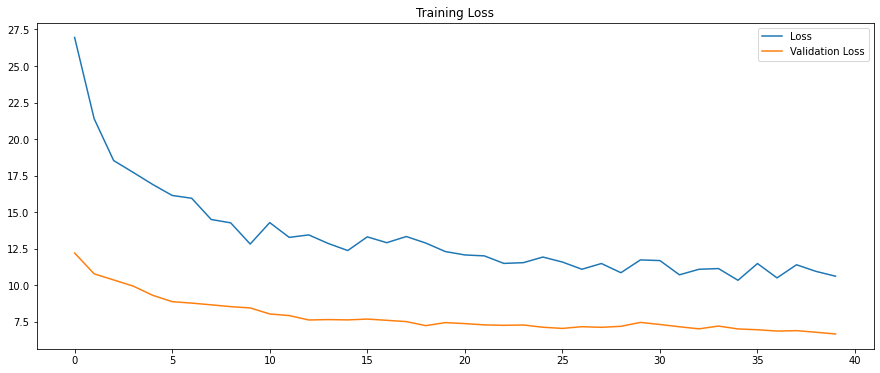

In [17]:
fig = plt.figure(figsize=[15, 6])
ax = fig.add_subplot(1, 1, 1)
ax.plot(history.history['loss'], label='Loss')
ax.plot(history.history['val_loss'], label='Validation Loss')
ax.legend()
ax.set_title('Training Loss')

### Get Embeddings 

In [18]:
def ComputeDistance(x, y):
    x = K.l2_normalize(x, axis=1)
    y = K.l2_normalize(y, axis=1)
    dist = K.sum(K.square(x - y), axis=-1)
    return dist

#### Train 

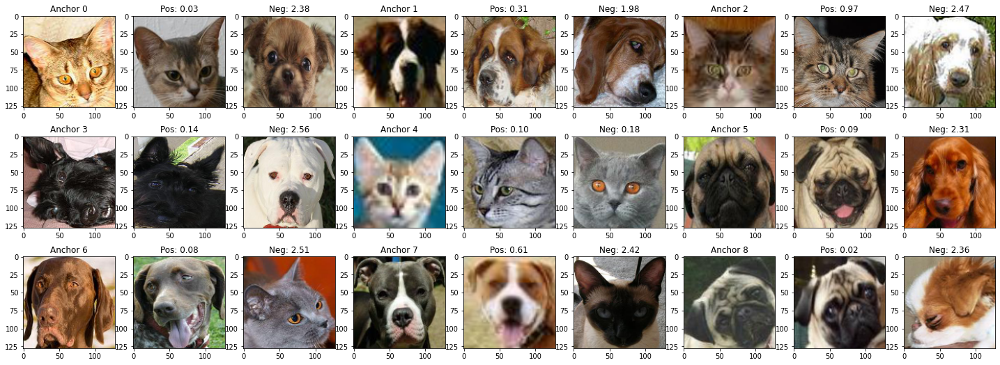

In [19]:
x = GetTripletData(X_train, y_train, 40)
anchor_embedding = base_network.predict(x[0])
positive_embedding = base_network.predict(x[1])
negative_embedding = base_network.predict(x[2])
pos_dists = ComputeDistance(anchor_embedding, positive_embedding)
neg_dists = ComputeDistance(anchor_embedding, negative_embedding)

fig = plt.figure(figsize=[25, 9])
for i in range(9):
    ax = fig.add_subplot(3, 9, i*3 + 1)
    ax.imshow(x[0][i,:,:])
    ax.set_title('Anchor ' + str(i))
    
    ax = fig.add_subplot(3, 9, i*3 + 2)
    ax.imshow(x[1][i,:,:])  
    ax.set_title('Pos: ' + '%1.2f' % float(pos_dists[i]))
    
    ax = fig.add_subplot(3, 9, i*3 + 3)
    ax.imshow(x[2][i,:,:])    
    ax.set_title('Neg: ' + '%1.2f' % float(neg_dists[i]))

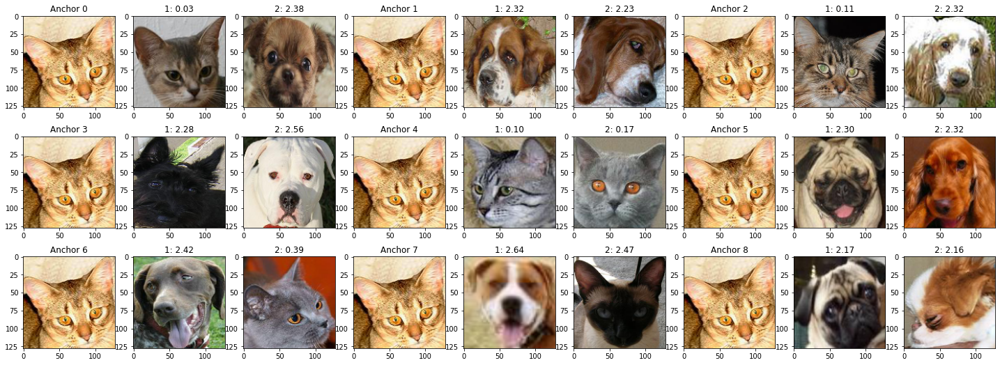

In [20]:
for i in range(9):
    x[0][i,:] = x[0][0,:]

anchor_embedding = base_network.predict(x[0])
positive_embedding = base_network.predict(x[1])
negative_embedding = base_network.predict(x[2])
pos_dists = ComputeDistance(anchor_embedding, positive_embedding)
neg_dists = ComputeDistance(anchor_embedding, negative_embedding)

fig = plt.figure(figsize=[25, 9])
for i in range(9):
    ax = fig.add_subplot(3, 9, i*3 + 1)
    ax.imshow(x[0][i,:,:])
    ax.set_title('Anchor ' + str(i))
    
    ax = fig.add_subplot(3, 9, i*3 + 2)
    ax.imshow(x[1][i,:,:])    
    ax.set_title('1: ' + '%1.2f' % float(pos_dists[i]))
    
    ax = fig.add_subplot(3, 9, i*3 + 3)
    ax.imshow(x[2][i,:,:])    
    ax.set_title('2: ' + '%1.2f' % float(neg_dists[i]))

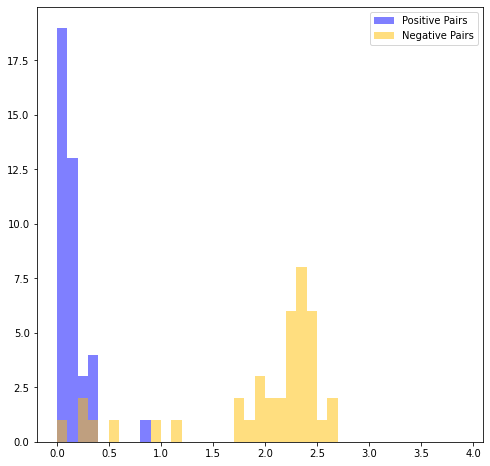

In [21]:
triplet_train = GetTripletData(X_train, y_train, 40)
anchor_embedding = base_network.predict(triplet_train[0])
positive_embedding = base_network.predict(triplet_train[1])
negative_embedding = base_network.predict(triplet_train[2])

positive_distances = ComputeDistance(anchor_embedding, positive_embedding)
negative_distances = ComputeDistance(anchor_embedding, negative_embedding)

fig = plt.figure(figsize=[8, 8])
ax = fig.add_subplot(1, 1, 1)
ax.hist(positive_distances, np.arange(0, 4.0, 0.1), label='Positive Pairs', fc=(0, 0, 1.0, 0.5))
ax.hist(negative_distances, np.arange(0, 4.0, 0.1), label='Negative Pairs', fc=(1.0, 0.75, 0, 0.5))
ax.legend();

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


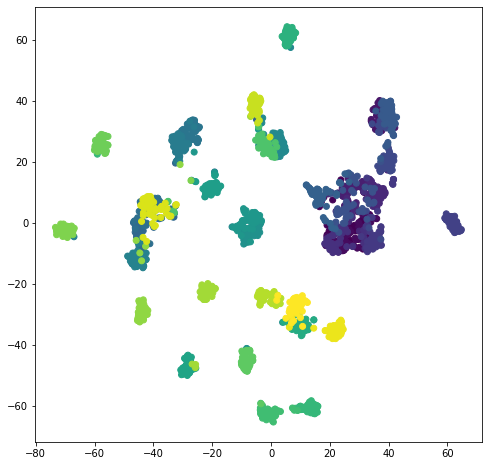

In [22]:
# convert labels into numeric form
y_train_num = pd.factorize(y_train)[0]
train_embeddings = base_network.predict(X_train)
tsne_embeddings = TSNE(random_state=4).fit_transform(train_embeddings)
fig = plt.figure(figsize=[8, 8])
ax = fig.add_subplot(1, 1, 1)
ax.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], c = y_train_num);

#### Test

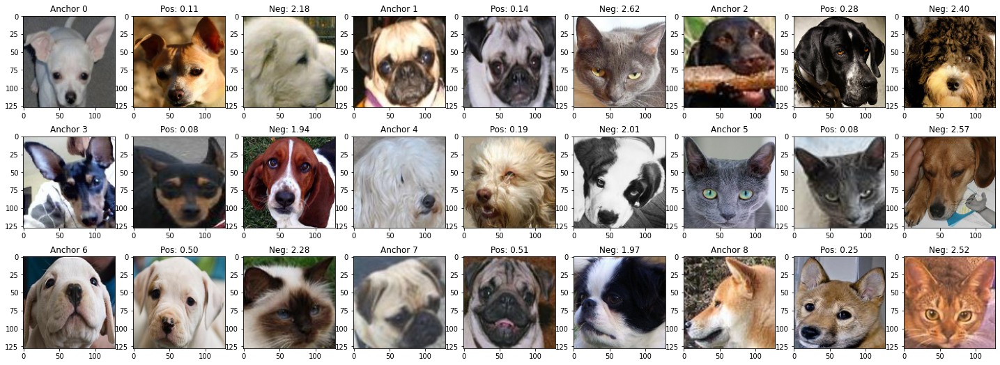

In [23]:
x = GetTripletData(X_test, y_test, 40)
anchor_embedding = base_network.predict(x[0])
positive_embedding = base_network.predict(x[1])
negative_embedding = base_network.predict(x[2])
pos_dists = ComputeDistance(anchor_embedding, positive_embedding)
neg_dists = ComputeDistance(anchor_embedding, negative_embedding)

fig = plt.figure(figsize=[25, 9])
for i in range(9):
    ax = fig.add_subplot(3, 9, i*3 + 1)
    ax.imshow(x[0][i,:,:])
    ax.set_title('Anchor ' + str(i))
    
    ax = fig.add_subplot(3, 9, i*3 + 2)
    ax.imshow(x[1][i,:,:])  
    ax.set_title('Pos: ' + '%1.2f' % float(pos_dists[i]))
    
    ax = fig.add_subplot(3, 9, i*3 + 3)
    ax.imshow(x[2][i,:,:])    
    ax.set_title('Neg: ' + '%1.2f' % float(neg_dists[i]))

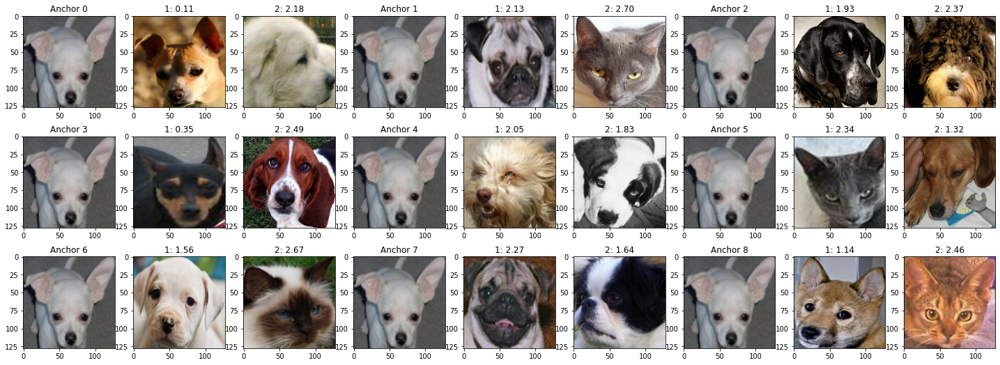

In [24]:
for i in range(9):
    x[0][i,:] = x[0][0,:]

anchor_embedding = base_network.predict(x[0])
positive_embedding = base_network.predict(x[1])
negative_embedding = base_network.predict(x[2])
pos_dists = ComputeDistance(anchor_embedding, positive_embedding)
neg_dists = ComputeDistance(anchor_embedding, negative_embedding)

fig = plt.figure(figsize=[25, 9])
for i in range(9):
    ax = fig.add_subplot(3, 9, i*3 + 1)
    ax.imshow(x[0][i,:,:])
    ax.set_title('Anchor ' + str(i))
    
    ax = fig.add_subplot(3, 9, i*3 + 2)
    ax.imshow(x[1][i,:,:])    
    ax.set_title('1: ' + '%1.2f' % float(pos_dists[i]))
    
    ax = fig.add_subplot(3, 9, i*3 + 3)
    ax.imshow(x[2][i,:,:])    
    ax.set_title('2: ' + '%1.2f' % float(neg_dists[i]))

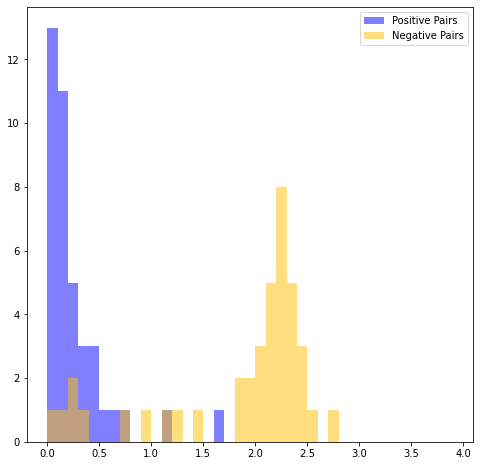

In [25]:
triplet_test = GetTripletData(X_test, y_test, 40)
anchor_embedding = base_network.predict(triplet_test[0])
positive_embedding = base_network.predict(triplet_test[1])
negative_embedding = base_network.predict(triplet_test[2])

positive_distances = ComputeDistance(anchor_embedding, positive_embedding)
negative_distances = ComputeDistance(anchor_embedding, negative_embedding)

fig = plt.figure(figsize=[8, 8])
ax = fig.add_subplot(1, 1, 1)
ax.hist(positive_distances, np.arange(0, 4.0, 0.1), label='Positive Pairs', fc=(0, 0, 1.0, 0.5))
ax.hist(negative_distances, np.arange(0, 4.0, 0.1), label='Negative Pairs', fc=(1.0, 0.75, 0, 0.5))
ax.legend();

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


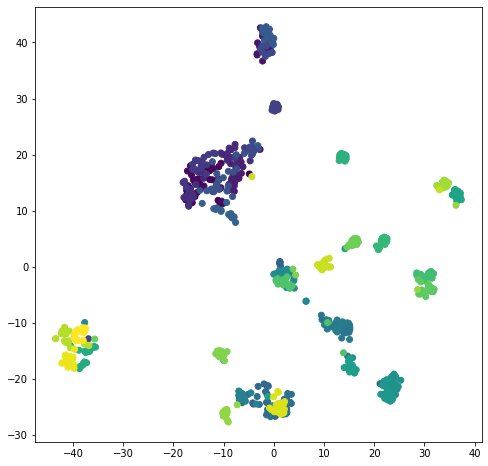

In [26]:
# convert labels into numeric form
y_test_num = pd.factorize(y_test)[0]
test_embeddings = base_network.predict(X_test)
tsne_embeddings = TSNE(random_state=4).fit_transform(test_embeddings)
fig = plt.figure(figsize=[8, 8])
ax = fig.add_subplot(1, 1, 1)
ax.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], c = y_test_num);

## GMM
As we know there are 37 classes in the dataset, we can use GMM to perform clustering.

After training the triplet network, we use it to predict on the train set to get the train embedding. 

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


Text(0.5, 1.0, 'Number of clusters: 37')

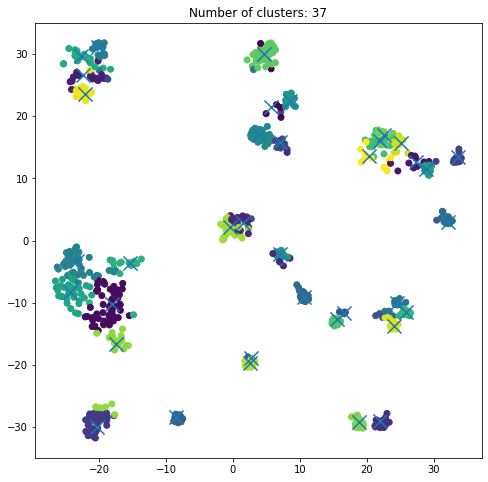

In [27]:
class_num = 37
# as we have 37 classes, so the k value should be 37
gmm = GaussianMixture(class_num, covariance_type='tied', random_state=4).fit(train_embeddings)
gmm_test_labels = gmm.predict(test_embeddings)

tsne_embeddings_2 = TSNE(random_state=4).fit_transform(np.vstack([test_embeddings, gmm.means_]))
fig = plt.figure(figsize=[8, 8])
ax = fig.add_subplot(1, 1, 1)
ax.scatter(tsne_embeddings_2[:-class_num,0], tsne_embeddings_2[:-class_num,1], c=gmm_test_labels)
ax.scatter(tsne_embeddings_2[-class_num:,0], tsne_embeddings_2[-class_num:,1], s=200, marker='x')
ax.set_title('Number of clusters: %d' % class_num)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


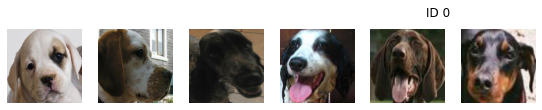

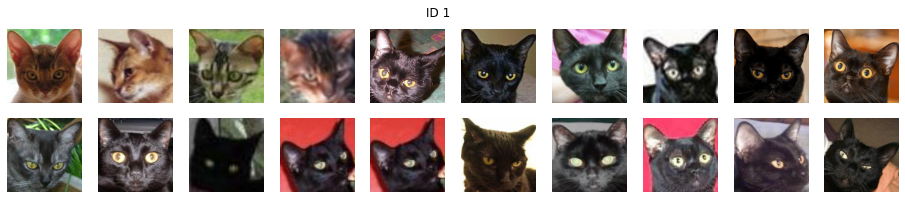

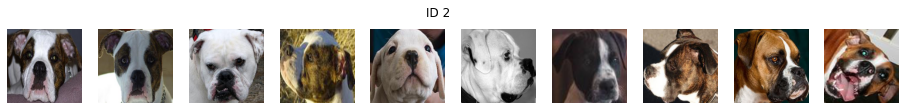

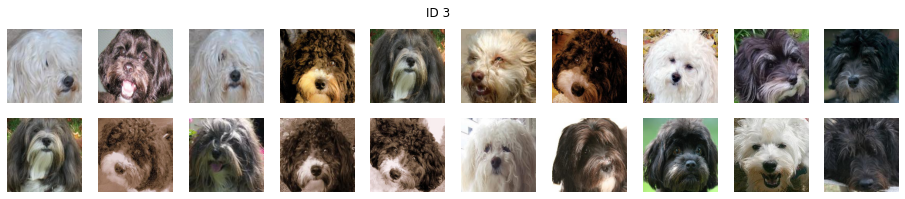

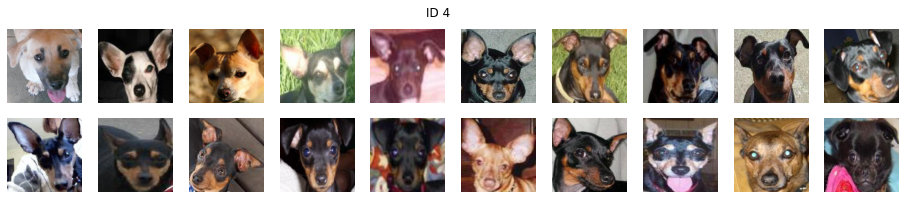

...

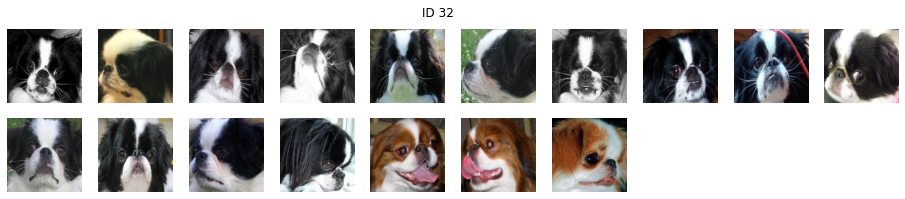

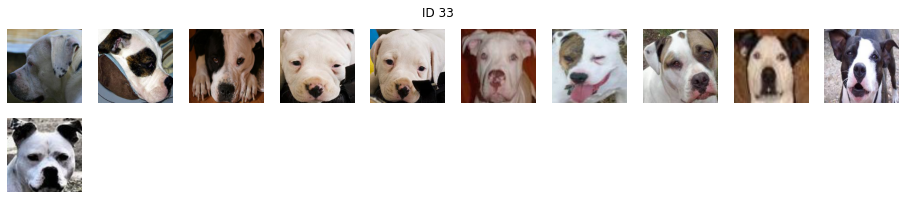

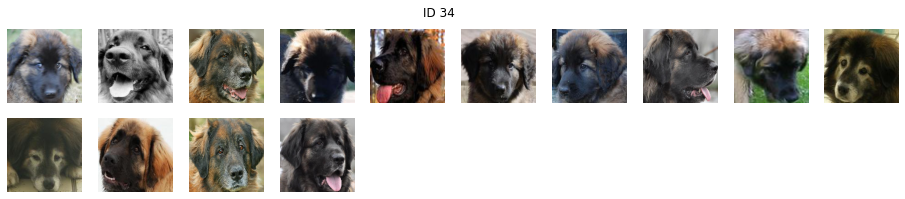

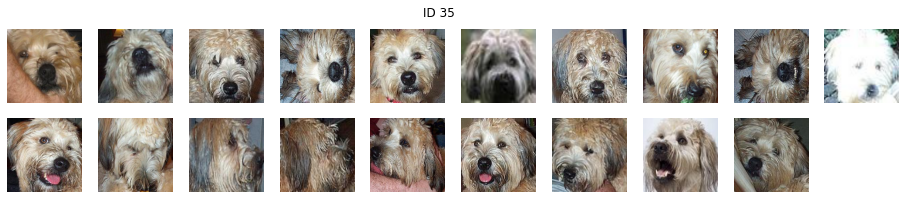

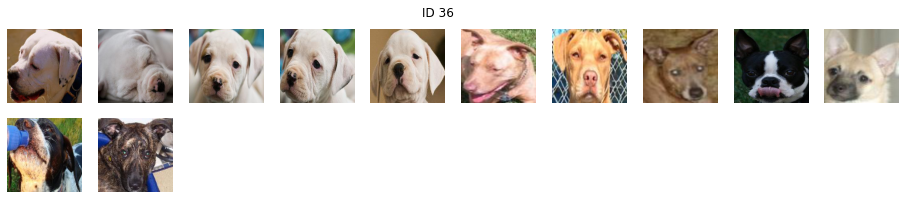

In [28]:
plot_animal(X_test, gmm_test_labels)

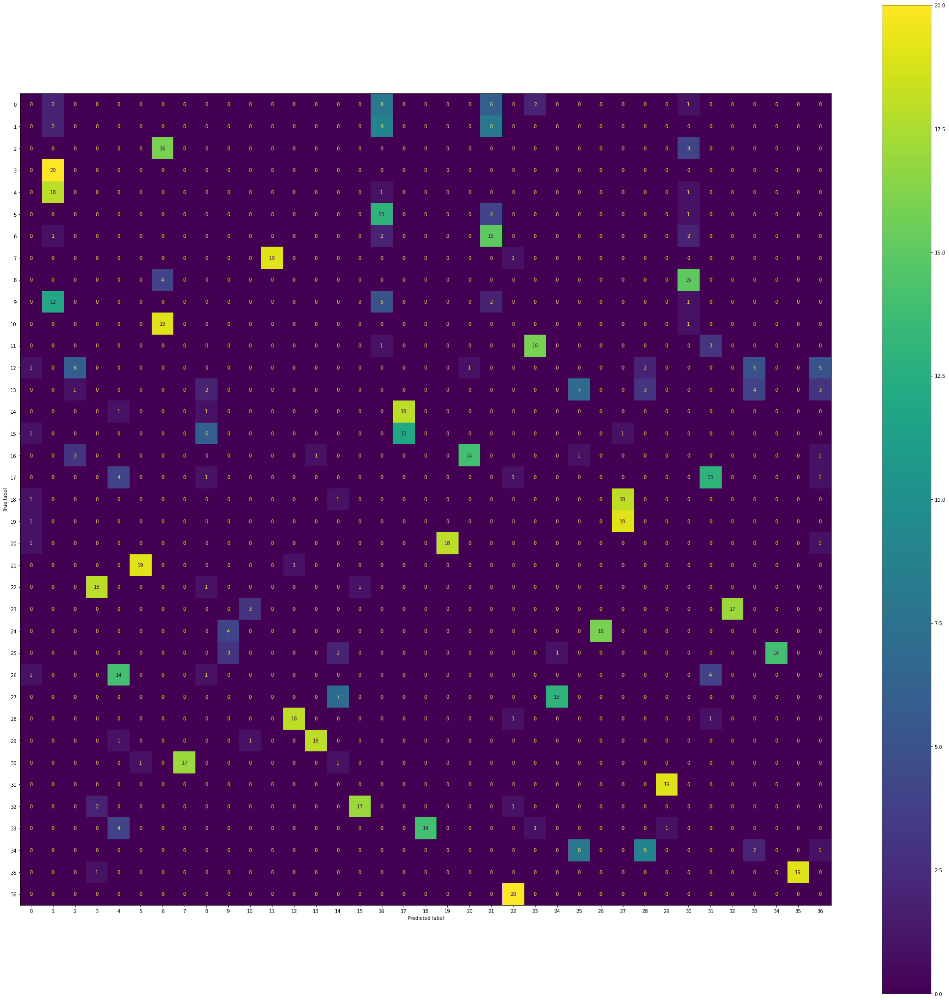

In [29]:
fig = plt.figure(figsize=[37, 37])
ax = fig.add_subplot(1, 1, 1)
cm = confusion_matrix(y_test_num, gmm_test_labels)
c = ConfusionMatrixDisplay(cm)
# c = ConfusionMatrixDisplay(cm, display_labels=np.arange(1, 37)) 
c.plot(ax = ax)    

In [30]:
purity = homogeneity_score(y_test_num, gmm_test_labels)
print('Purity:       ' + str(purity))
completeness = completeness_score(y_test_num, gmm_test_labels)
print('Completeness: ' + str(completeness))
vmeasure = v_measure_score(y_test_num, gmm_test_labels)
print('V-Measures:   ' + str(vmeasure))

Purity:       0.7959838371883065
Completeness: 0.8237747355854407
V-Measures:   0.8096408761550334


Embedding size = 16

Purity:       0.7999923259499855

Completeness: 0.8236009698083785

V-Measures:   0.8116250014248979


---
Embedding size = 32

Purity:       0.7959838371883065

Completeness: 0.8237747355854407

V-Measures:   0.8096408761550334
